#### import libraries

In [423]:
# Obviously
import pandas as pd

# Some sklearn tools for preprocessing and building a pipeline. 
# ColumnTransformer was introduced in 0.20 so make sure you have this version
# !pip install xgboost
import numpy as np 

# To build our pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

!pip install impyute
from impyute.imputation.cs import mice

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

# Other helpers
from sklearn.metrics import accuracy_score, classification_report


!pip install category_encoders

from category_encoders.target_encoder import TargetEncoder

In [424]:
!pip install lightgbm

from lightgbm import LGBMClassifier

!pip install catboost

from catboost import CatBoostClassifier

In [425]:
from google.colab import drive
drive.mount('/content/drive')

import sys
sys.path.append('/content/drive/My Drive/Colab Notebooks/Data scientist')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### The Dataset

The dataset can be downloaded [here](https://archive.ics.uci.edu/ml/datasets/bank+marketing). It consists of data from marketing campaigns of a Portuguese bank. We will try to build classifiers that can predict whether or not the client targeted by the campaign ended up subscribing to a term deposit (column `y`).

In [426]:
communes_df=pd.read_pickle('/content/drive/My Drive/Colab Notebooks/Data scientist/data/commune_scoring.pkl')
# Separation Variables d'intérêts et variables explicatives
print(communes_df.camping.value_counts())
print(communes_df.info())

0    31610
1     5067
Name: camping, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36677 entries, 0 to 36676
Data columns (total 96 columns):
codgeo                                                             36677 non-null object
nb_pharmacies_et_parfumerie                                        36676 non-null float64
dynamique_entrepreneuriale                                         36676 non-null float64
dynamique_entrepreneuriale_service_et_commerce                     36676 non-null float64
synergie_medicale_commune                                          36677 non-null int64
orientation_economique                                             36677 non-null object
indice_fiscal_partiel                                              36677 non-null float64
score_fiscal                                                       36677 non-null float64
indice_synergie_medicale                                           36677 non-null float64
score_synergie_medicale            

 keep in mind data in unbalanced we need to pick carefully good evaluation metric, maybe even oversampling..


In [427]:
dff = communes_df.select_dtypes(exclude=["number","bool"])
df_categorical = dff.assign(score_equipement_de_sante_bv=communes_df['score_equipement_de_sante_bv'])
df_categorical = df_categorical.fillna(df_categorical.mode().iloc[0]) # impute missing data using Mode or most frequent For categorical data 
# df_categorical = df_categorical.str.strip()

string_features = ['orientation_economique','seg_croissance_pop','libgeo','urbanite_ruralite','dynamique_demographique_bv',
                   'seg_environnement_demographique_obsolete','environnement_demographique'
                  ,'syn_medical','seg_cap_fiscale','seg_dyn_entre','dyn_setc']

# for fe in string_features:
#     df_categorical[fe] = df_categorical[fe].map(lambda x: "".join(w.strip() for w in x))



##############################

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
X_incomplete = communes_df.select_dtypes(include=numerics).astype(float)
df_numeric = X_incomplete[X_incomplete.columns.difference(['score_equipement_de_sante_bv'])]### score_equipment_de_sante  is categorical

print(len(X_incomplete))

36677


In [428]:
df_numeric.columns

Index(['camping', 'capacite_fisc', 'capacite_fiscale', 'capacite_hotel',
       'densite_medicale_bv', 'dep_moyenne_salaires_cadre_horaires',
       'dep_moyenne_salaires_employe_horaires',
       'dep_moyenne_salaires_horaires', 'dep_moyenne_salaires_ouvrie_horaires',
       'dep_moyenne_salaires_prof_intermediaire_horaires',
       'dynamique_demographique_insee', 'dynamique_entrepreneuriale',
       'dynamique_entrepreneuriale_service_et_commerce', 'evolution_pop_',
       'evolution_population', 'indice_demographique', 'indice_fiscal_partiel',
       'indice_menages', 'indice_synergie_medicale',
       'moyenne_revenus_fiscaux_departementaux',
       'moyenne_revenus_fiscaux_regionaux', 'moyenne_revnus_fiscaux',
       'nb_actifs_non_salaries', 'nb_actifs_salaries', 'nb_atifs',
       'nb_creation_commerces', 'nb_creation_construction',
       'nb_creation_enteprises', 'nb_creation_industrielles',
       'nb_creation_services', 'nb_de_commerce',
       'nb_de_services_aux_particuli

In [0]:
for f in df_numeric.columns:
  X_incomplete[f].fillna((X_incomplete[f].mean()), inplace=True)

In [503]:
![categorical_dist](https://drive.google.com/file/d/1CKOwndhp47xm0sAxLe8EkYaiyhAe77zL/view?usp=sharing)

/bin/bash: -c: line 0: syntax error near unexpected token `https://drive.google.com/file/d/1CKOwndhp47xm0sAxLe8EkYaiyhAe77zL/view?usp=sharing'
/bin/bash: -c: line 0: `[categorical_dist](https://drive.google.com/file/d/1CKOwndhp47xm0sAxLe8EkYaiyhAe77zL/view?usp=sharing)'


In [0]:
# Source: https://maxhalford.github.io/blog/target-encoding-done-the-right-way/
def calc_smooth_mean(df1, cat_name, target, weight):
    # Compute the global mean
    mean = communes_df[target].mean()

    # Compute the number of values and the mean of each group
    agg = communes_df.groupby(cat_name)[target].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']

    # Compute the "smoothed" means
    smooth = (counts * means + weight * mean) / (counts + weight)

    return df1[cat_name].map(smooth)

Feature 'codgeo' has 36677 unique categories note good idea to use target encoding

Feature 'libgeo' has 34125 unique categories

Feature 'dep' has 100 unique categories

Feature 'cp' has 100 unique categories

In [0]:
WEIGHT = 300
df_categorical['codgeo'] = calc_smooth_mean(df1=communes_df, cat_name='codgeo', target='camping', weight=WEIGHT).astype('category')
df_categorical['libgeo'] = calc_smooth_mean(df1=communes_df, cat_name='libgeo', target='camping', weight=WEIGHT).astype('category')
df_categorical['dep'] = calc_smooth_mean(df1=communes_df, cat_name='dep', target='camping', weight=WEIGHT).astype('category')
df_categorical['cp'] = calc_smooth_mean(df1=communes_df, cat_name='cp', target='camping', weight=WEIGHT).astype('category')

In [432]:
#0.137693	0.137693	0.0883396	0.0883396
#
#
df_categorical[['codgeo','libgeo','dep','cp']].head()

,codgeo,libgeo,dep,cp
0,0.137693,0.137693,0.143874,0.143874
1,0.137693,0.137693,0.143874,0.143874
2,0.137693,0.137693,0.143874,0.143874
3,0.141015,0.141015,0.143874,0.143874
4,0.137693,0.137693,0.143874,0.143874


In [433]:
# Decide which categorical variables you want to use in model
for col_name in df_categorical.columns:
#     if df_numeric[col_name].dtypes == 'object':
      unique_cat = len(df_categorical[col_name].unique())
      print("Feature '{col_name}' has {unique_cat} unique categories".format(col_name=col_name, unique_cat=unique_cat))

Feature 'codgeo' has 2 unique categories
Feature 'orientation_economique' has 5 unique categories
Feature 'seg_croissance_pop' has 2 unique categories
Feature 'libgeo' has 35 unique categories
Feature 'dep' has 99 unique categories
Feature 'urbanite_ruralite' has 6 unique categories
Feature 'dynamique_demographique_bv' has 7 unique categories
Feature 'seg_environnement_demographique_obsolete' has 8 unique categories
Feature 'environnement_demographique' has 7 unique categories
Feature 'syn_medical' has 3 unique categories
Feature 'seg_cap_fiscale' has 3 unique categories
Feature 'seg_dyn_entre' has 3 unique categories
Feature 'dyn_setc' has 3 unique categories
Feature 'cp' has 99 unique categories
Feature 'score_equipement_de_sante_bv' has 5 unique categories


In [434]:
df_categorical['urbanite_ruralite'].value_counts()

Com rurale < 2 000 m habts    30052
Com < 10 m habts               2505
Com > 200 m habts              1369
Com < 50 m habts               1325
Com < 200 m habts               836
Com rurale > 2 000 habts        590
Name: urbanite_ruralite, dtype: int64

In [435]:
# In this case, bucket low frequecy categories as "Other"
df_categorical['urbanite_ruralite'] = ['Com rurale < 2 000 m habts ' if x == 'Com rurale < 2 000 m habts' else 'Other' for x in df_categorical['urbanite_ruralite']]

print(df_categorical['urbanite_ruralite'].value_counts().sort_values(ascending=False))

Com rurale < 2 000 m habts     30052
Other                           6625
Name: urbanite_ruralite, dtype: int64


In [436]:
df_categorical['seg_cap_fiscale'].value_counts() 

Fiscalité moyenne    28780
Fiscalité faible      6628
Fiscalité élevée      1269
Name: seg_cap_fiscale, dtype: int64

In [437]:
# In this case, bucket low frequecy categories as "Other"
df_categorical['seg_cap_fiscale'] = ['Fiscalité moyenne' if x == 'Fiscalité moyenne' else 'Other' for x in df_categorical['seg_cap_fiscale']]

print(df_categorical['seg_cap_fiscale'].value_counts().sort_values(ascending=False))

Fiscalité moyenne    28780
Other                 7897
Name: seg_cap_fiscale, dtype: int64


In [438]:
df_categorical['syn_medical'].value_counts()

Faible Synergie Médicale    24669
Forte Synergie Médicale      6048
Synergie Médicale            5960
Name: syn_medical, dtype: int64

In [439]:
# In this case, bucket low frequecy categories as "Other"
df_categorical['syn_medical'] = ['Faible Synergie Médicale' if x == 'Faible Synergie Médicale' else 'Other' for x in df_categorical['syn_medical']]

print(df_categorical['syn_medical'].value_counts().sort_values(ascending=False))

Faible Synergie Médicale    24669
Other                       12008
Name: syn_medical, dtype: int64


In [440]:
df_categorical['seg_dyn_entre'].value_counts()

Faible dynamique        30187
Dynamique Economique     5059
Moyenne dynamique        1431
Name: seg_dyn_entre, dtype: int64

In [441]:
# In this case, bucket low frequecy categories as "Other"
df_categorical['seg_dyn_entre'] = ['Faible dynamique' if x == 'Faible dynamique' else 'Other' for x in df_categorical['seg_dyn_entre']]

print(df_categorical['seg_dyn_entre'].value_counts().sort_values(ascending=False))

Faible dynamique    30187
Other                6490
Name: seg_dyn_entre, dtype: int64


In [442]:
df_categorical.dyn_setc.value_counts()

Faible Dynamique Serv et Com              31916
Bonne Dynamique Entreprise Serv et Com     3788
Dynamique Serv et Com                       973
Name: dyn_setc, dtype: int64

In [443]:
# In this case, bucket low frequecy categories as "Other"
df_categorical['dyn_setc'] = ['Faible Dynamique Serv et Com' if x == 'Faible Dynamique Serv et Com' else 'Other' for x in df_categorical['dyn_setc']]

print(df_categorical['dyn_setc'].value_counts().sort_values(ascending=False))

Faible Dynamique Serv et Com    31916
Other                            4761
Name: dyn_setc, dtype: int64


In [0]:
# df_categorical.seg_environnement_demographique_obsolete.value_counts()

In [0]:
# # In this case, bucket low frequecy categories as "Other"
# for x in df_categorical['seg_environnement_demographique_obsolete'] :
  
#     if x is 'Zone rurale en croissance démographique':  
#         df_categorical['seg_environnement_demographique_obsolete'] = 'Zone rurale en croissance démographique'
    
#     elif x is 'Zone rurale en déclin démographique':  
#         df_categorical['seg_environnement_demographique_obsolete'] = 'Zone rurale en déclin démographique'
    
#     else:
#         df_categorical['seg_environnement_demographique_obsolete'] = 'other'
        
        
    
# print(df_categorical['seg_environnement_demographique_obsolete'].value_counts().sort_values(ascending=False))

In [446]:
for c in df_categorical.columns:
  print(df_categorical[c].value_counts().sort_values(ascending=False).head(10))
  print()
 

0.137693    31610
0.141015     5067
Name: codgeo, dtype: int64

Bassin Résidentiel         16870
Bassin Urbain               8671
Bassin Industriel           7122
Bassins Agroalimentaire     2564
Bassin diversifié           1450
Name: orientation_economique, dtype: int64

en croissance démographique    36666
en déclin démographique           11
Name: seg_croissance_pop, dtype: int64

0.137693    27899
0.141015     4613
0.137237     1824
0.136784      558
0.140548      446
0.136334      244
0.140084      162
0.135887      150
0.139624      116
0.135443       66
Name: libgeo, dtype: int64

0.149452    894
0.082463    866
0.063123    816
0.107621    782
0.095163    745
0.072277    730
0.082866    707
0.104817    706
0.064900    693
0.076354    675
Name: dep, dtype: int64

Com rurale < 2 000 m habts     30052
Other                           6625
Name: urbanite_ruralite, dtype: int64

Grande Ville                                          8671
1.Accroissement par excédent naturel et migratoi

##pipeline


We'll define a new `ColumnTransformer` object that keeps our numerical features and apply one hot encoding on our categorical features. 

That will allow us to create a clean pipeline that includes both features engineering (one hot encoding here) and training the model (a nice way to avoid data leakage)

In [0]:
numeric_features =list(df_numeric)
numeric_features.remove('camping')

categorical_features =list(df_categorical)

te_features = ['codgeo','libgeo','dep','cp']


for i in te_features:
  categorical_features.remove(i)
 


numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])


                                 
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
         ])

                                 
# target_encoding = Pipeline(steps=[
#     ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
#     ('TE', ce.TargetEncoder(cols=te_features) )
#          ])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', LogisticRegression(class_weight="balanced", 
                                                  solver="liblinear", 
                                                  random_state=42,max_iter = 1100))])

In [448]:
# print(data.shape)

df_numeric = pd.DataFrame(data=X_incomplete,index= range(0,len(X_incomplete)),columns=X_incomplete.columns)  
# print(df_numeric.shape)

merged =pd.concat([df_numeric, df_categorical], axis=1)


#duplicated columns

merged = merged.loc[:,~merged.columns.duplicated()]

print(merged.shape)

(36677, 96)


Now we can define our 4 models as sklearn `Pipeline` objects, containing our preprocessing step and training of one given algorithm.

Let's split the data into training and test sets.

In [449]:
# Get X, y
y = merged['camping']
X = merged.drop("camping", axis=1)

# X.reset_index(drop=True).head()
np.shape(X)

(36677, 95)

In [0]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size=.3)



We're good to go!

### Train Logistic Regression

First let's fine tune our logistic regression and evaluate its performance. We can treat our pipeline object like a normal sklearn model and call `.fit` or `.predict` on it. We can also directly pass it to the `GridSearchCV` function.

In [451]:
clf.fit(X_train, y_train)

print("model score: %.3f" % clf.score(X_test, y_test))

model score: 0.816


In [452]:
grid_search = GridSearchCV(clf, {'classifier__C': [0.1, 1.0, 10]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")


grid_search.fit(X_train, y_train)

print(("best logistic regression from grid search: %.3f"
       % grid_search.score(X_test, y_test)))

best logistic regression from grid search: 0.816


Let's see our best parameters and score

In [453]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'classifier__C': 1.0}
0.8188369103727652


Let's retrain our model on the whole training data with the best parameters. First we need to update the parameters inside our pipeline. We can use the `set_params` method for that.

In [454]:
clf.set_params(**grid_search.best_params_)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                             

We can run `get_params` to get the parameters of our model as a sanity check that we have properly updated the parameters.

In [455]:
clf.get_params("classifier")

{'classifier': LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                    fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                    max_iter=1100, multi_class='warn', n_jobs=None, penalty='l2',
                    random_state=42, solver='liblinear', tol=0.0001, verbose=0,
                    warm_start=False),
 'classifier__C': 1.0,
 'classifier__class_weight': 'balanced',
 'classifier__dual': False,
 'classifier__fit_intercept': True,
 'classifier__intercept_scaling': 1,
 'classifier__l1_ratio': None,
 'classifier__max_iter': 1100,
 'classifier__multi_class': 'warn',
 'classifier__n_jobs': None,
 'classifier__penalty': 'l2',
 'classifier__random_state': 42,
 'classifier__solver': 'liblinear',
 'classifier__tol': 0.0001,
 'classifier__verbose': 0,
 'classifier__warm_start': False,
 'memory': None,
 'preprocessor': ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                   transformer_weights=None,
               

Now we can fit the model on the whole training set and calculate accuracy on the test set.

In [456]:
clf.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                             

Generate predictions

In [0]:
y_pred = clf.predict(X_test)

In [458]:
accuracy_score(y_test, y_pred)

0.8157942566339513

In [459]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.95      0.83      0.89      9484
         1.0       0.41      0.72      0.52      1520

    accuracy                           0.82     11004
   macro avg       0.68      0.78      0.70     11004
weighted avg       0.87      0.82      0.84     11004



Here the pipeline creates a temporary DataFrame that contains the one hot encoded features. If you want to debug your pipeline, you can access intermediary stages at any time. For instance below we get the preprocessor, extract the stage for categorical features and get the categories it has learnt:

In [460]:
ohe_categories = clf.named_steps["preprocessor"].transformers_[1][1].named_steps['onehot'].get_feature_names()

ohe_categories

array(['x0_Bassin Industriel', 'x0_Bassin Résidentiel',
       'x0_Bassin Urbain', 'x0_Bassin diversifié',
       'x0_Bassins Agroalimentaire', 'x1_en croissance démographique',
       'x1_en déclin démographique', 'x2_Com rurale < 2 000 m habts ',
       'x2_Other',
       'x3_1.Accroissement par excédent naturel et migratoire',
       'x3_2.Accroissement par excédent naturel',
       'x3_3.Accroissement par excédent migratoire',
       'x3_4.Déclin par déficit naturel et migratoire',
       'x3_5.Déclin par déficit naturel',
       'x3_6.Déclin par déficit migratoire', 'x3_Grande Ville',
       'x4_Com < 10 m habts en croissance démographique',
       'x4_Com < 200 m habts en croissance démographique',
       'x4_Com < 50 m habts en croissance démographique',
       'x4_Com > 200 m habts en croissance démographique',
       'x4_Com rurale < 2 000 m habts en croissance démographique',
       'x4_Com rurale > 2 000 habts en croissance démographique',
       'x4_Zone rurale en croissanc

In [461]:
all_features = numeric_features + list(ohe_categories)

len(all_features)

124

  Great, so now we have a nice list of columns after processing. Let's visualise the data in a dataframe just for sanity check. For that we can also call methods directly on specificy stages:

In [0]:
df = pd.DataFrame(clf.named_steps["preprocessor"].transform(X_train),columns=all_features)
df.head()

# Save processed data
X_train_processed = pd.DataFrame(preprocessor.transform(X_train), columns=all_features)
X_test_processed = pd.DataFrame(preprocessor.transform(X_test), columns=all_features)

#124==codgeo or libgeo

###Global interpretation

In [463]:
!pip install eli5
import eli5

eli5.show_weights(clf.named_steps["classifier"],feature_names=all_features)

That gives us the weights associated to each feature, that can be seen as the contribution of each feature into predicting that the class will be y=1 

In [464]:
i = 15
X_test.iloc[[i]]

,nb_pharmacies_et_parfumerie,dynamique_entrepreneuriale,dynamique_entrepreneuriale_service_et_commerce,synergie_medicale_commune,indice_fiscal_partiel,score_fiscal,indice_synergie_medicale,score_synergie_medicale,reg,nb_omnipraticiens_bv,nb_infirmiers_liberaux_bv,nb_dentistes_liberaux_bv,nb_pharmaciens_liberaux_bv,densite_medicale_bv,score_equipement_de_sante_bv,indice_demographique,score_demographique,indice_menages,score_menages,population,evolution_population,evolution_pop_,nb_menages,nb_residences_principales,nb_proprietaire,nb_logement,nb_residences_secondaires,nb_log_vacants,nb_occupants_residence_principale,nb_femme,nb_homme,nb_mineurs,nb_majeurs,nb_etudiants,nb_entreprises_secteur_services,nb_entreprises_secteur_commerce,nb_entreprises_secteur_construction,nb_entreprises_secteur_industrie,nb_creation_enteprises,nb_creation_industrielles,...,valeur_ajoutee_regionale,score_urbanite,nb_atifs,nb_actifs_salaries,nb_actifs_non_salaries,nb_logement_secondaire_et_occasionnel,nb_hotel,capacite_hotel,taux_etudiants,taux_propriete,dynamique_demographique_insee,capacite_fisc,capacite_fiscale,moyenne_revnus_fiscaux,nb_education_sante_action_sociale,nb_services_personnels_et_domestiques,nb_sante_action_sociale,nb_industries_des_biens_intermediaires,nb_de_commerce,nb_de_services_aux_particuliers,nb_institution_de_education_sante_action_sociale_administration,pib_regionnal,score_croissance_population,score_croissance_entrepreneuriale,score_va_region,score_pib,codgeo,orientation_economique,seg_croissance_pop,libgeo,dep,urbanite_ruralite,dynamique_demographique_bv,seg_environnement_demographique_obsolete,environnement_demographique,syn_medical,seg_cap_fiscale,seg_dyn_entre,dyn_setc,cp
36301,0.0,265.0,146.0,297.0,85.82625,23.02832,298.47754,0.37906,11.0,12.0,12.0,6.0,6.0,1.0,1.0,281.64596,0.21732,250.14446,0.14943,4620.0,223.0,4.0,1660.0,1661.0,1418.0,1754.0,14.0,79.0,4528.0,4556.0,4466.0,5515.0,3507.0,428.0,62.0,52.0,24.0,25.0,13.0,0.0,...,261877.286917,100.0,2216.0,1967.0,249.0,14.0,0.0,0.0,0.0,80.0,-22.0,247.0,247.0,8440.0,19.0,5.0,20.0,10383.0,28477.0,19139.0,39842.0,500839.0,72.95082,0.05821,100.0,100.0,0.137693,Bassin Urbain,en croissance démographique,0.137693,0.12484,Other,Grande Ville,Com > 200 m habts en croissance démographique,Bassin Urbain en croissance démographique,Other,Other,Other,Other,0.12484


In [465]:
y_test.iloc[i]

0.0

In [466]:
eli5.show_prediction(clf.named_steps["classifier"], 
                     clf.named_steps["preprocessor"].transform(X_test)[i],feature_names=all_features, show_feature_values=True)

In [0]:
# # Save processed data
# X_train_processed = pd.DataFrame(preprocessor.transform(X_train), columns=all_features)
# X_test_processed = pd.DataFrame(preprocessor.transform(X_test), columns=all_features)

### Train a Decision Tree

Define the new model

In [0]:
from sklearn.tree import DecisionTreeClassifier

# Decision Tree
dt_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", DecisionTreeClassifier(class_weight="balanced"))])

In [469]:
gs = GridSearchCV(dt_model, {"model__max_depth": [3, 5, 7], 
                             "model__min_samples_split": [2, 5]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                    

Let's see our best parameters and score

In [470]:
print(gs.best_params_)
print(gs.best_score_)

{'model__max_depth': 3, 'model__min_samples_split': 2}
0.8065672106882718


In [471]:
dt_model.set_params(**gs.best_params_)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                             

In [0]:
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X_test)

In [473]:
accuracy_score(y_test, y_pred)

0.8340603416939295

In [474]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.95      0.85      0.90      9484
         1.0       0.44      0.71      0.54      1520

    accuracy                           0.83     11004
   macro avg       0.69      0.78      0.72     11004
weighted avg       0.88      0.83      0.85     11004



In [475]:
eli5.show_weights(dt_model.named_steps["model"],feature_names=all_features)

Weight,Feature
0.7626,nb_residences_secondaires
0.2080,nb_entreprises_secteur_commerce
0.0294,dep_moyenne_salaires_employe_horaires
0,nb_services_personnels_et_domestiques
0,nb_entreprises_secteur_industrie
0,nb_entreprises_secteur_services
0,nb_etudiants
0,nb_femme
0,nb_homme
0,nb_hotel


In [476]:

eli5.show_prediction(dt_model.named_steps["model"], 
                     dt_model.named_steps["preprocessor"].transform(X_test)[i],
                     feature_names=all_features, show_feature_values=True)

### Train a Random Forest

In [0]:
from sklearn.ensemble import RandomForestClassifier

# Random Forest
rf_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", RandomForestClassifier(class_weight="balanced", 
                                                      n_estimators=100, n_jobs=-1))])

In [478]:
gs = GridSearchCV(rf_model, {"model__max_depth": [10, 15], 
                             "model__min_samples_split": [5, 10]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                    

Let's see our best parameters and score

In [479]:
print(gs.best_params_)
print(gs.best_score_)

{'model__max_depth': 15, 'model__min_samples_split': 5}
0.8892610914190006


In [480]:
rf_model.set_params(**gs.best_params_)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                             

In [0]:
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

In [482]:
accuracy_score(y_test, y_pred)

0.893584151217739

In [483]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.93      0.95      0.94      9484
         1.0       0.63      0.56      0.59      1520

    accuracy                           0.89     11004
   macro avg       0.78      0.75      0.76     11004
weighted avg       0.89      0.89      0.89     11004



### Train an XGB model

Pipeline can work with any class compatible with scikit-learn, here we are using it with the XGBClassifier from xgboost for instance:

In [0]:
from xgboost.sklearn import XGBClassifier

# XGBoost
xgb_model = Pipeline([("preprocessor", preprocessor), 
                      # Add a scale_pos_weight to make it balanced
                      ("model", XGBClassifier(scale_pos_weight=(1 - y.mean()), 
                                              n_jobs=-1))])

In [485]:
gs = GridSearchCV(xgb_model, {"model__max_depth": [5, 10],
                              "model__min_child_weight": [5, 10],
                              "model__n_estimators": [25]},
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('prepyrocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                   

Let's see our best parameters and score.

In [512]:
print(gs.best_params_)
print(gs.best_score_)
xgb_model.set_params(**gs.best_params_)
xgb_model.fit(X_train, y_train)

{'model__max_depth': 10, 'model__min_child_weight': 10, 'model__n_estimators': 25}
0.8966229112296966


Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                             

Generate predictions

In [0]:
y_pred = xgb_model.predict(X_test)

In [514]:
accuracy_score(y_test, y_pred)

0.9006724827335514

In [489]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.91      0.98      0.94      9484
         1.0       0.75      0.42      0.54      1520

    accuracy                           0.90     11004
   macro avg       0.83      0.70      0.74     11004
weighted avg       0.89      0.90      0.89     11004



###LGBM and CAtboost

In [0]:
# LGBm
lgb_model = Pipeline([("preprocessor", preprocessor), 
                      ("model",  LGBMClassifier(n_estimators=40))])

In [491]:
param_dist = {"model__max_depth": [5, 10],
              "model__min_child_weight": [5, 10],
              "model__n_estimators": [25]
              }
gs = GridSearchCV(lgb_model, n_jobs=-1, param_grid=param_dist, cv = 3, scoring="accuracy", )


gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                    

In [492]:
print(gs.best_params_)
print(gs.best_score_)
lgb_model.set_params(**gs.best_params_)
lgb_model.fit(X_train, y_train)

{'model__max_depth': 10, 'model__min_child_weight': 10, 'model__n_estimators': 25}
0.8966229112296966


Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                             

In [0]:
y_pred = lgb_model.predict(X_test)

In [494]:
accuracy_score(y_test, y_pred)

0.900945110868775

In [495]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.91      0.98      0.94      9484
         1.0       0.75      0.42      0.54      1520

    accuracy                           0.90     11004
   macro avg       0.83      0.70      0.74     11004
weighted avg       0.89      0.90      0.89     11004



In [0]:
# catboost
catb_model = Pipeline([("preprocessor", preprocessor), 
                      # Add a scale_pos_weight to make it balanced
                      ("model",  CatBoostClassifier(iterations =100, learning_rate = 0.03,eval_metric='AUC') )])


In [505]:
catb_model.fit(X_train, y_train)

0:	total: 27.1ms	remaining: 2.68s
1:	total: 54.6ms	remaining: 2.67s
2:	total: 80.8ms	remaining: 2.61s
3:	total: 109ms	remaining: 2.62s
4:	total: 136ms	remaining: 2.59s
5:	total: 163ms	remaining: 2.54s
6:	total: 188ms	remaining: 2.5s
7:	total: 214ms	remaining: 2.46s
8:	total: 247ms	remaining: 2.5s
9:	total: 273ms	remaining: 2.45s
10:	total: 299ms	remaining: 2.42s
11:	total: 325ms	remaining: 2.38s
12:	total: 350ms	remaining: 2.34s
13:	total: 377ms	remaining: 2.32s
14:	total: 406ms	remaining: 2.3s
15:	total: 436ms	remaining: 2.29s
16:	total: 474ms	remaining: 2.31s
17:	total: 503ms	remaining: 2.29s
18:	total: 530ms	remaining: 2.26s
19:	total: 560ms	remaining: 2.24s
20:	total: 586ms	remaining: 2.21s
21:	total: 611ms	remaining: 2.17s
22:	total: 637ms	remaining: 2.13s
23:	total: 663ms	remaining: 2.1s
24:	total: 698ms	remaining: 2.09s
25:	total: 722ms	remaining: 2.06s
26:	total: 748ms	remaining: 2.02s
27:	total: 777ms	remaining: 2s
28:	total: 804ms	remaining: 1.97s
29:	total: 831ms	remaining: 

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                             

In [0]:
y_pred = catb_model.predict(X_test)

In [533]:
accuracy_score(y_test, y_pred)

0.9006724827335514

In [534]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.91      0.98      0.94      9484
         1.0       0.76      0.42      0.54      1520

    accuracy                           0.90     11004
   macro avg       0.83      0.70      0.74     11004
weighted avg       0.89      0.90      0.89     11004



#model interpretibility using shap locally and globally.


In [508]:
# !pip install shap

import shap
# Need to load JS vis in the notebook
shap.initjs()

In [0]:
explainer = shap.TreeExplainer(xgb_model.named_steps["model"])

In [0]:
observations = xgb_model.named_steps["preprocessor"].transform(X_train.sample(500, random_state=42))
shap_values = explainer.shap_values(observations) # calculationg of shap features , in other word features importance


The shap_values object above is a list with two arrays. The first array is the SHAP values for a negative outcome (no camping), and the second array is the list of SHAP values for the positive outcome (there is camping). We'll pull out SHAP values for negative outcomes (pulling out shap_values[0]).

The next figure  shows how each feature contributes to shifting the prediction from the base value to the output value """ explainer.expected_value"""  of the model either by decreasing or increasing the probability of our class.

In [528]:
i = 0
shap.initjs()

shap.force_plot(explainer.expected_value, shap_values[i], 
                features=observations[i], feature_names=all_features)


##Globaly

We can also visualise all points in our dataset at once with a given class by passing all explanations

In [525]:
shap.initjs()

shap.force_plot(explainer.expected_value, shap_values,
                features=observations, feature_names=all_features)

Another interesting plot that we can generate with SHAP is the summary_plot, it can be seen as a feature importance plot with more meaningful insights. Below we're plotting the summary plot for class 1 on the whole subset. The colour corresponds to the value of the feature and the x axis corresponds to the SHAP value, meaning the impact on the probability.

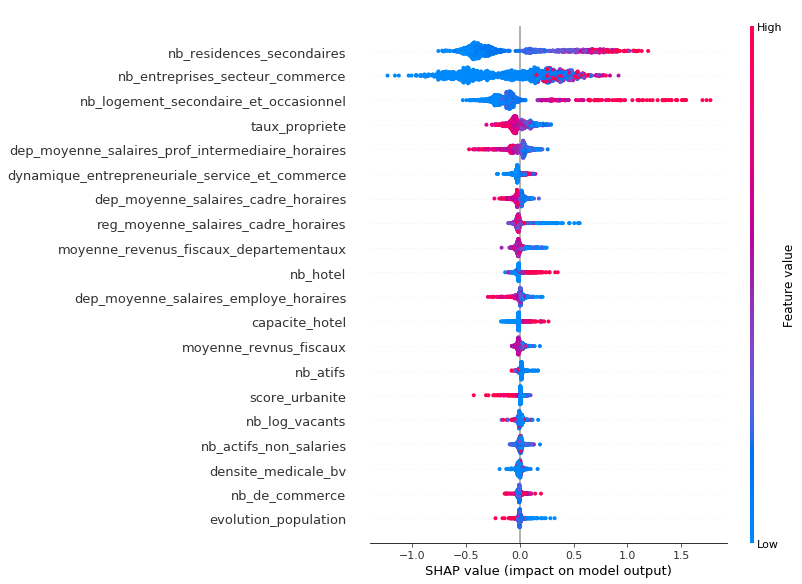

In [526]:
shap.initjs()
shap.summary_plot(shap_values, features=observations, feature_names=all_features)
